02. Here we find the correlation between first selected variable in each feature (Eye Gaze, Head Pose, and AUs) to get an intuition of the most respresentative variable for each feature.  

* 1.1. Eye Gaze: left-eye direction (3D-vector) and Eye Gaze in Radians
* 1.2. Head Pose: Head location with respect to camera and Head Rotation
* 1.3. 17 AUs : AU1, AU2, AU4, AU5, AU6, AU7, AU9, AU10, AU12, AU14, AU15, AU17, AU20, AU23, AU25, AU26, AU45

Note : We used one sample video to obtain an intuition of the most influencing variable

In [1]:
# %matplotlib notebook 
%matplotlib inline
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib import cm
import pandas as pd
import numpy as np
from scipy.stats import pearsonr

In [2]:
#load the data set by label
path = ('C:/Users/hasegawa-lab-pc/OneDrive - Japan Advanced Institute of Science and Technology/Documents/Dataset/DAiSEE/OpenFace_2.2.0_win_x64/processed/csv/')

df_label = pd.read_csv(path+'labels/AllLabels.csv') #Load label file
df_feat = pd.read_csv(path+'csv_train/181374016.csv') #Load a feature sample

In [3]:
df_feat

,frame,face_id,timestamp,confidence,success,gaze_0_x,gaze_0_y,gaze_0_z,gaze_1_x,gaze_1_y,...,AU12_c,AU14_c,AU15_c,AU17_c,AU20_c,AU23_c,AU25_c,AU26_c,AU28_c,AU45_c
0,1,0,0.000,0.98,1,-0.028039,0.044401,-0.998620,-0.092259,0.071057,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
1,2,0,0.033,0.98,1,-0.034464,0.038139,-0.998678,-0.078796,0.066848,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
2,3,0,0.067,0.98,1,-0.032093,0.019279,-0.999299,-0.066075,0.057544,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,4,0,0.100,0.98,1,-0.023442,0.016895,-0.999582,-0.077705,0.061642,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
4,5,0,0.133,0.98,1,-0.025537,0.021714,-0.999438,-0.072913,0.051067,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
295,296,0,9.833,0.98,1,-0.077457,0.162204,-0.983712,-0.112366,0.200844,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
296,297,0,9.867,0.98,1,-0.077260,0.153933,-0.985056,-0.108666,0.187629,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
297,298,0,9.900,0.98,1,-0.093894,0.122258,-0.988047,-0.110964,0.184575,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
298,299,0,9.933,0.98,1,-0.095042,0.117448,-0.988521,-0.115383,0.182754,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [4]:
# remove special character
df_feat.columns = df_feat.columns.str.replace(' ', '')

for num, col_name in enumerate(df_feat.columns): 
    print(num,col_name)

0 frame
1 face_id
2 timestamp
3 confidence
4 success
5 gaze_0_x
6 gaze_0_y
7 gaze_0_z
8 gaze_1_x
9 gaze_1_y
10 gaze_1_z
11 gaze_angle_x
12 gaze_angle_y
13 eye_lmk_x_0
14 eye_lmk_x_1
15 eye_lmk_x_2
16 eye_lmk_x_3
17 eye_lmk_x_4
18 eye_lmk_x_5
19 eye_lmk_x_6
20 eye_lmk_x_7
21 eye_lmk_x_8
22 eye_lmk_x_9
23 eye_lmk_x_10
24 eye_lmk_x_11
25 eye_lmk_x_12
26 eye_lmk_x_13
27 eye_lmk_x_14
28 eye_lmk_x_15
29 eye_lmk_x_16
30 eye_lmk_x_17
31 eye_lmk_x_18
32 eye_lmk_x_19
33 eye_lmk_x_20
34 eye_lmk_x_21
35 eye_lmk_x_22
36 eye_lmk_x_23
37 eye_lmk_x_24
38 eye_lmk_x_25
39 eye_lmk_x_26
40 eye_lmk_x_27
41 eye_lmk_x_28
42 eye_lmk_x_29
43 eye_lmk_x_30
44 eye_lmk_x_31
45 eye_lmk_x_32
46 eye_lmk_x_33
47 eye_lmk_x_34
48 eye_lmk_x_35
49 eye_lmk_x_36
50 eye_lmk_x_37
51 eye_lmk_x_38
52 eye_lmk_x_39
53 eye_lmk_x_40
54 eye_lmk_x_41
55 eye_lmk_x_42
56 eye_lmk_x_43
57 eye_lmk_x_44
58 eye_lmk_x_45
59 eye_lmk_x_46
60 eye_lmk_x_47
61 eye_lmk_x_48
62 eye_lmk_x_49
63 eye_lmk_x_50
64 eye_lmk_x_51
65 eye_lmk_x_52
66 eye_lmk

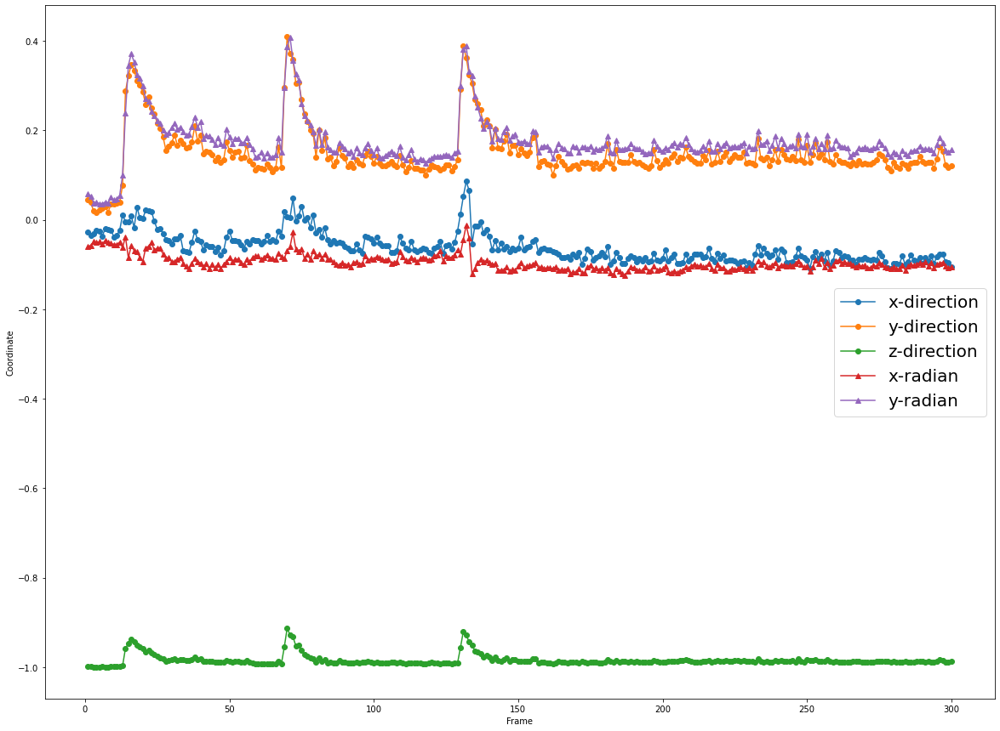

In [5]:
# 1.1. Eye Gaze
# Plot left-eye direction (3D-vector) and Eye Gaze in Radians to see the trend of eye gaze movement
plt.figure(figsize=(20, 15))
gaze_left = np.mean(df_feat.iloc[:,5:7], axis=1)
gaze_rad = np.mean(df_feat.iloc[:,11:12], axis=1) 

# plt.plot(df_feat.frame,gaze_left, '-o', label="Left eye direction (mean)")
# plt.plot(df_feat.frame,gaze_rad, '-o', label="Eye radian (mean)")
plt.plot(df_feat.frame,df_feat.iloc[:,5], '-o', label="x-direction")
plt.plot(df_feat.frame,df_feat.iloc[:,6], '-o', label="y-direction")
plt.plot(df_feat.frame,df_feat.iloc[:,7], '-o', label="z-direction")
plt.plot(df_feat.frame,df_feat.iloc[:,11], '-^', label="x-radian")
plt.plot(df_feat.frame,df_feat.iloc[:,12], '-^', label="y-radian")
plt.xlabel("Frame")
plt.ylabel("Coordinate")
plt.legend(prop={"size":20}) 
plt.show()

In [6]:
# Pearson correlation
corr, _ = pearsonr(df_feat.iloc[:,7],df_feat.iloc[:,5])
# corr, _ = pearsonr(gaze_left,gaze_rad)
print('Pearson correlation between Eye Direction and Eye Radian: %.3f' % corr)

"""
The coefficient returns a value between -1 and 1 that represents the limits of correlation from a full negative correlation to a full positive correlation. 
A value of 0 means no correlation.
Often a value below -0.5 or above 0.5 indicates a notable correlation, and values below those values suggests a less notable correlation.
"""

Pearson correlation between Eye Direction and Eye Radian: 0.621


'\nThe coefficient returns a value between -1 and 1 that represents the limits of correlation from a full negative correlation to a full positive correlation. \nA value of 0 means no correlation.\nOften a value below -0.5 or above 0.5 indicates a notable correlation, and values below those values suggests a less notable correlation.\n'

In [7]:
for num, col_name in enumerate(df_feat.columns): 
    print(num,col_name)

0 frame
1 face_id
2 timestamp
3 confidence
4 success
5 gaze_0_x
6 gaze_0_y
7 gaze_0_z
8 gaze_1_x
9 gaze_1_y
10 gaze_1_z
11 gaze_angle_x
12 gaze_angle_y
13 eye_lmk_x_0
14 eye_lmk_x_1
15 eye_lmk_x_2
16 eye_lmk_x_3
17 eye_lmk_x_4
18 eye_lmk_x_5
19 eye_lmk_x_6
20 eye_lmk_x_7
21 eye_lmk_x_8
22 eye_lmk_x_9
23 eye_lmk_x_10
24 eye_lmk_x_11
25 eye_lmk_x_12
26 eye_lmk_x_13
27 eye_lmk_x_14
28 eye_lmk_x_15
29 eye_lmk_x_16
30 eye_lmk_x_17
31 eye_lmk_x_18
32 eye_lmk_x_19
33 eye_lmk_x_20
34 eye_lmk_x_21
35 eye_lmk_x_22
36 eye_lmk_x_23
37 eye_lmk_x_24
38 eye_lmk_x_25
39 eye_lmk_x_26
40 eye_lmk_x_27
41 eye_lmk_x_28
42 eye_lmk_x_29
43 eye_lmk_x_30
44 eye_lmk_x_31
45 eye_lmk_x_32
46 eye_lmk_x_33
47 eye_lmk_x_34
48 eye_lmk_x_35
49 eye_lmk_x_36
50 eye_lmk_x_37
51 eye_lmk_x_38
52 eye_lmk_x_39
53 eye_lmk_x_40
54 eye_lmk_x_41
55 eye_lmk_x_42
56 eye_lmk_x_43
57 eye_lmk_x_44
58 eye_lmk_x_45
59 eye_lmk_x_46
60 eye_lmk_x_47
61 eye_lmk_x_48
62 eye_lmk_x_49
63 eye_lmk_x_50
64 eye_lmk_x_51
65 eye_lmk_x_52
66 eye_lmk

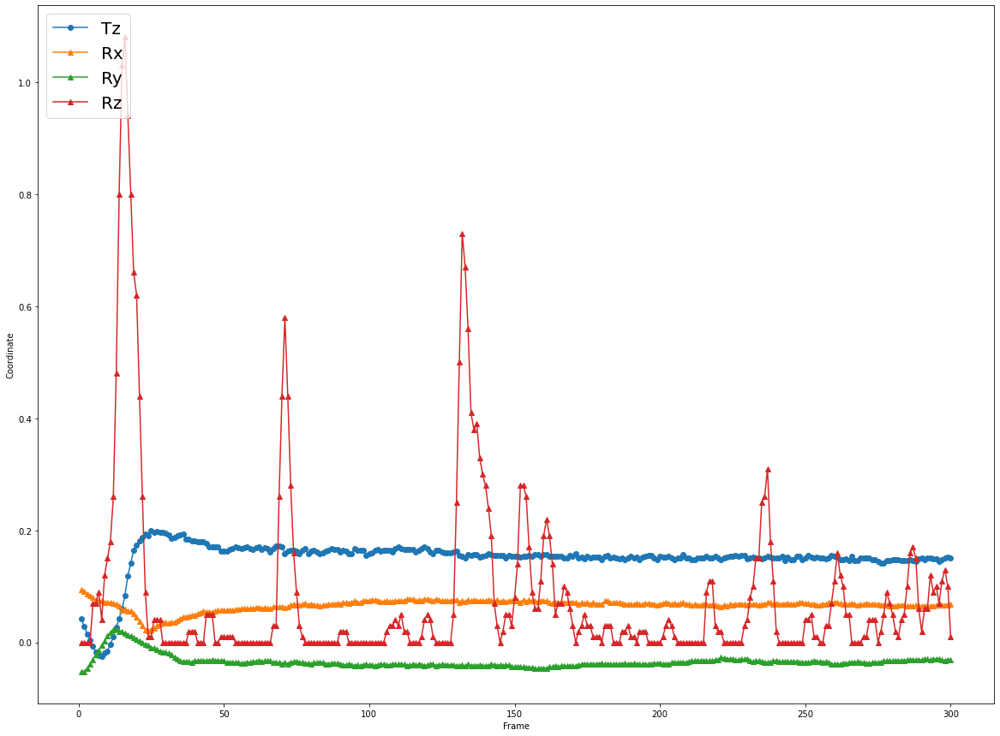

In [8]:
# 1.2. Head Pose
plt.figure(figsize=(20, 15))
# plt.plot(df_feat.frame,df_feat.iloc[:,293], '-o', label="Tx")
# plt.plot(df_feat.frame,df_feat.iloc[:,294], '-o', label="Ty") 
plt.plot(df_feat.frame,df_feat.iloc[:,296], '-o', label="Tz")
plt.plot(df_feat.frame,df_feat.iloc[:,297], '-^', label="Rx")
plt.plot(df_feat.frame,df_feat.iloc[:,298], '-^', label="Ry")
plt.plot(df_feat.frame,df_feat.iloc[:,299], '-^', label="Rz")
plt.xlabel("Frame")
plt.ylabel("Coordinate")
plt.legend(loc='upper left',prop={"size":20}) 
plt.show()

In [9]:
for num, col_name in enumerate(df_feat.columns): 
    print(num,col_name)

0 frame
1 face_id
2 timestamp
3 confidence
4 success
5 gaze_0_x
6 gaze_0_y
7 gaze_0_z
8 gaze_1_x
9 gaze_1_y
10 gaze_1_z
11 gaze_angle_x
12 gaze_angle_y
13 eye_lmk_x_0
14 eye_lmk_x_1
15 eye_lmk_x_2
16 eye_lmk_x_3
17 eye_lmk_x_4
18 eye_lmk_x_5
19 eye_lmk_x_6
20 eye_lmk_x_7
21 eye_lmk_x_8
22 eye_lmk_x_9
23 eye_lmk_x_10
24 eye_lmk_x_11
25 eye_lmk_x_12
26 eye_lmk_x_13
27 eye_lmk_x_14
28 eye_lmk_x_15
29 eye_lmk_x_16
30 eye_lmk_x_17
31 eye_lmk_x_18
32 eye_lmk_x_19
33 eye_lmk_x_20
34 eye_lmk_x_21
35 eye_lmk_x_22
36 eye_lmk_x_23
37 eye_lmk_x_24
38 eye_lmk_x_25
39 eye_lmk_x_26
40 eye_lmk_x_27
41 eye_lmk_x_28
42 eye_lmk_x_29
43 eye_lmk_x_30
44 eye_lmk_x_31
45 eye_lmk_x_32
46 eye_lmk_x_33
47 eye_lmk_x_34
48 eye_lmk_x_35
49 eye_lmk_x_36
50 eye_lmk_x_37
51 eye_lmk_x_38
52 eye_lmk_x_39
53 eye_lmk_x_40
54 eye_lmk_x_41
55 eye_lmk_x_42
56 eye_lmk_x_43
57 eye_lmk_x_44
58 eye_lmk_x_45
59 eye_lmk_x_46
60 eye_lmk_x_47
61 eye_lmk_x_48
62 eye_lmk_x_49
63 eye_lmk_x_50
64 eye_lmk_x_51
65 eye_lmk_x_52
66 eye_lmk

Text(0.5, 1.0, 'AU Intensity (from 0 to 5)')

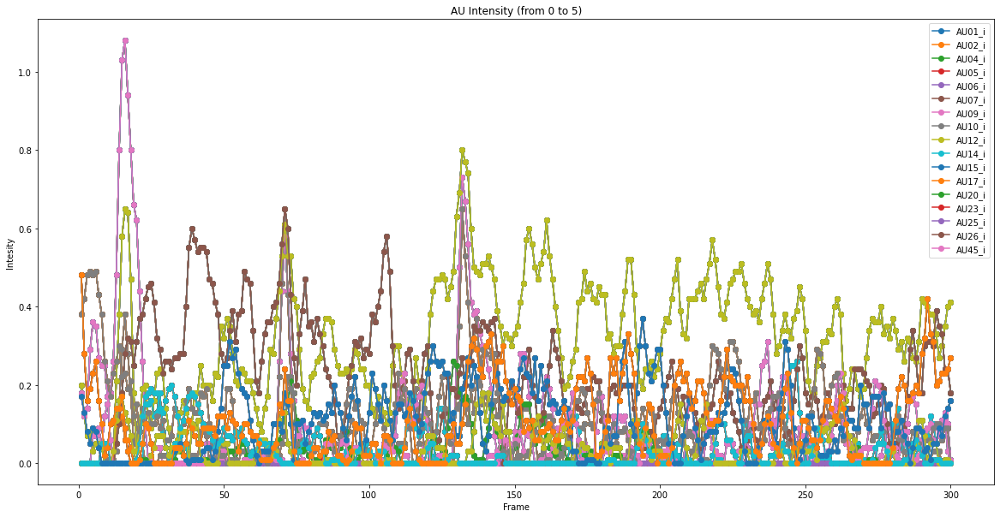

In [10]:
# AUs intensity (from 0 to 5)
AUi = ["AU01_i", "AU02_i", "AU04_i", "AU05_i", "AU06_i", "AU07_i", "AU09_i", "AU10_i", "AU12_i", "AU14_i", "AU15_i", "AU17_i", "AU20_i", "AU23_i", "AU25_i", "AU26_i", "AU45_i"]
plt.figure(figsize=(20,10))
for au in AUi:
    label = [au]
    for i in range(299,315):
        plt.plot(df_feat.frame,df_feat.iloc[:,i], '-o')

plt.legend(AUi)
plt.xlabel("Frame")
plt.ylabel("Intesity")
plt.title("AU Intensity (from 0 to 5)")


In [11]:
# # AUs intensity (from 0 to 5)
# AUp = ["AU01_p", "AU02_p", "AU04_p", "AU05_p", "AU06_p", "AU07_p", "AU09_p", "AU10_p", "AU12_p", "AU14_p", "AU15_p", "AU17_p", "AU20_p", "AU23_p", "AU25_p", "AU26_p", "AU45_p"]
# plt.figure(figsize=(20,10))
# for au in AUp:
#     label = [au]
#     for i in range(316,331):
#         plt.plot(df_feat.frame,df_feat.iloc[:,i], '-o')
# plt.plot(df_feat.frame,df_feat.iloc[:,333], '-o')

# plt.legend(AUp)
# plt.xlabel("Frame")
# plt.ylabel("Intesity")
# plt.title("AU presense (1|0)")

for num, col_name in enumerate(df_feat.columns): 
    print(num,col_name)

0 frame
1 face_id
2 timestamp
3 confidence
4 success
5 gaze_0_x
6 gaze_0_y
7 gaze_0_z
8 gaze_1_x
9 gaze_1_y
10 gaze_1_z
11 gaze_angle_x
12 gaze_angle_y
13 eye_lmk_x_0
14 eye_lmk_x_1
15 eye_lmk_x_2
16 eye_lmk_x_3
17 eye_lmk_x_4
18 eye_lmk_x_5
19 eye_lmk_x_6
20 eye_lmk_x_7
21 eye_lmk_x_8
22 eye_lmk_x_9
23 eye_lmk_x_10
24 eye_lmk_x_11
25 eye_lmk_x_12
26 eye_lmk_x_13
27 eye_lmk_x_14
28 eye_lmk_x_15
29 eye_lmk_x_16
30 eye_lmk_x_17
31 eye_lmk_x_18
32 eye_lmk_x_19
33 eye_lmk_x_20
34 eye_lmk_x_21
35 eye_lmk_x_22
36 eye_lmk_x_23
37 eye_lmk_x_24
38 eye_lmk_x_25
39 eye_lmk_x_26
40 eye_lmk_x_27
41 eye_lmk_x_28
42 eye_lmk_x_29
43 eye_lmk_x_30
44 eye_lmk_x_31
45 eye_lmk_x_32
46 eye_lmk_x_33
47 eye_lmk_x_34
48 eye_lmk_x_35
49 eye_lmk_x_36
50 eye_lmk_x_37
51 eye_lmk_x_38
52 eye_lmk_x_39
53 eye_lmk_x_40
54 eye_lmk_x_41
55 eye_lmk_x_42
56 eye_lmk_x_43
57 eye_lmk_x_44
58 eye_lmk_x_45
59 eye_lmk_x_46
60 eye_lmk_x_47
61 eye_lmk_x_48
62 eye_lmk_x_49
63 eye_lmk_x_50
64 eye_lmk_x_51
65 eye_lmk_x_52
66 eye_lmk

In [12]:
corr, _ = pearsonr(df_feat.iloc[:,315],df_feat.iloc[:,333]) #AU45
print(corr)

0.7963373525942203


In [13]:
# Pearson correlation
AUi_index = list(range(299,315))
AUp_index = list(range(316,332))
# print(AUi_index)
# print(AUp_index)
pear =[]
for i in range(0,16): #betwween AU1 to AU26
    # print(i)
    corr, _ = pearsonr(df_feat.iloc[:,AUp_index[i]],df_feat.iloc[:,AUi_index[i]])
    pear.append(corr)

# for i in range(0,16):
#     print(pear[i])
print(pear)
# print(AUi)
# print('Pearson correlation : {%.3f}' % pear)
# print('X shape:{} | Y shape:{}'.format(X.shape, Y.shape))


[0.5286161394146701, nan, nan, 0.22452439318083334, nan, nan, nan, nan, nan, 0.5224705933586331, nan, 0.38109641752809675, nan, nan, 0.04145304846763116, nan]
C:\Users\hasegawa-lab-pc\miniconda3\envs\tf2.1\lib\site-packages\scipy\stats\stats.py:3913: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
